In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from google.colab import files
from datetime import datetime
from scipy.stats import ttest_ind
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import logging
import warnings
warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger()

In [ ]:
import seaborn as sns

try:
    sns.set(style='whitegrid')
except:
    plt.style.use('ggplot')

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)


In [ ]:

def load_fear_greed():
    """Load and return Fear/Greed dataset."""
    logger.info("Uploading Fear/Greed Dataset...")
    uploaded = files.upload()
    df = pd.read_csv(list(uploaded.keys())[0])
    return df


In [ ]:
def clean_fear_greed(df):
    logger.info("Cleaning Fear/Greed Dataset...")
    try:

        df['date'] = pd.to_datetime(df['date'], format='%d-%m-%Y', errors='coerce')
        df['timestamp_dt'] = pd.to_datetime(df['timestamp'], unit='s', errors='coerce')
        df['value'] = pd.to_numeric(df['value'], errors='coerce')
        df = df.drop_duplicates()
        df = df.dropna(subset=['date'])
        df['merge_date'] = df['date'].dt.strftime('%Y-%m-%d')
        df['classification'] = df['classification'].astype(str).str.strip().str.title()
        valid_classifications = ['Extreme Fear', 'Fear', 'Neutral', 'Greed', 'Extreme Greed']
        df = df[df['classification'].isin(valid_classifications)]
        df['classification'] = df['classification'].astype(str).str.strip()

        valid_classifications = ['Extreme Fear', 'Fear', 'Neutral', 'Greed', 'Extreme Greed']
        df = df[df['classification'].isin(valid_classifications)]

        logger.info("Fear/Greed Dataset cleaned successfully.")
        return df

    except Exception as e:
        logger.error(f"Error cleaning Fear/Greed Dataset: {str(e)}")
        raise


fear_greed_df = load_fear_greed()
fear_greed_df = clean_fear_greed(fear_greed_df)

print("\n✅ Unique Sentiment Classifications:")
print(fear_greed_df['classification'].value_counts())



Saving fear_greed_index.csv to fear_greed_index (2).csv

✅ Unique Sentiment Classifications:
Series([], Name: count, dtype: int64)


In [ ]:
def clean_fear_greed(df):
    logger.info("Cleaning Fear/Greed Dataset...")
    try:
        df['date'] = pd.to_datetime(df['date'], errors='coerce')
        df['timestamp_dt'] = pd.to_datetime(df['timestamp'], unit='s', errors='coerce')
        df['value'] = pd.to_numeric(df['value'], errors='coerce')


        df['classification'] = df['classification'].astype(str).str.strip()
        valid_classifications = ['Extreme Fear', 'Fear', 'Neutral', 'Greed', 'Extreme Greed']
        df = df[df['classification'].isin(valid_classifications)]

        df['merge_date'] = pd.to_datetime(df['date']).dt.date
        df = df.drop_duplicates()
        df = df.dropna(subset=['date'])


        logger.info("Fear/Greed Dataset cleaned successfully.")
        return df
    except Exception as e:
        logger.error(f"Error cleaning Fear/Greed Dataset: {str(e)}")
        raise


In [ ]:
df = fear_greed_df
df['classification'] = df['classification'].astype(str).str.strip()
print(df['classification'].unique())
fear_greed_df = clean_fear_greed(fear_greed_df)
print(fear_greed_df['classification'].value_counts())


['Fear' 'Extreme Fear' 'Neutral' 'Greed' 'Extreme Greed']
classification
Fear             781
Greed            633
Extreme Fear     508
Neutral          396
Extreme Greed    326
Name: count, dtype: int64


In [ ]:
df = pd.read_csv('/content/fear_greed_index.csv')
print("🧪 Raw unique classifications:")
print(df['classification'].unique())
df['classification'] = df['classification'].astype(str).str.strip().str.replace(r'[\n\r\t]+', '', regex=True)
print("\n✅ Cleaned classifications:")
print(df['classification'].unique())
valid_classifications = ['Extreme Fear', 'Fear', 'Neutral', 'Greed', 'Extreme Greed']
df = df[df['classification'].isin(valid_classifications)]
print("\n📊 Final classification counts:")
print(df['classification'].value_counts())


🧪 Raw unique classifications:
['Fear' 'Extreme Fear' 'Neutral' 'Greed' 'Extreme Greed']

✅ Cleaned classifications:
['Fear' 'Extreme Fear' 'Neutral' 'Greed' 'Extreme Greed']

📊 Final classification counts:
classification
Fear             781
Greed            633
Extreme Fear     508
Neutral          396
Extreme Greed    326
Name: count, dtype: int64


In [ ]:
fear_greed_df = df.copy()


In [ ]:

def load_trader_data():
    """Load and return Trader dataset."""
    logger.info("Uploading Historical Trader Data...")
    uploaded = files.upload()
    df = pd.read_csv(list(uploaded.keys())[0])
    return df

In [ ]:
def clean_trader_data(df):
    """Clean Trader dataset: handle dates, numeric columns, and duplicates."""
    logger.info("Cleaning Trader Dataset...")
    try:
        if df.empty:
            logger.error("Input Trader DataFrame is empty.")
            return df


        df['Timestamp IST'] = pd.to_datetime(df['Timestamp IST'], format='%d-%m-%Y %H:%M', errors='coerce')

        df['Timestamp_dt'] = pd.to_datetime(df['Timestamp'] / 1000, unit='s', errors='coerce')

        df['merge_date'] = df['Timestamp IST'].dt.strftime('%Y-%m-%d')

        numeric_cols = ['Execution Price', 'Size Tokens', 'Size USD', 'Closed PnL', 'Fee']
        for col in numeric_cols:
            df[col] = pd.to_numeric(df[col], errors='coerce')

        df['Side'] = df['Side'].str.upper()
        df['Direction'] = df['Direction'].str.title()
        df['Coin'] = df['Coin'].str.upper()

        df = df.drop_duplicates()

        df = df.dropna(subset=['Timestamp IST', 'Closed PnL'])

        df['leverage_approx'] = df['Size USD'] / (df['Execution Price'] * df['Size Tokens'])

        if df.empty:
            logger.error("Trader Dataset is empty after cleaning.")
        else:
            logger.info("Trader Dataset cleaned successfully.")
        return df
        df['merge_date'] = pd.to_datetime(df['Timestamp IST']).dt.date
    except Exception as e:
        logger.error(f"Error cleaning Trader Dataset: {str(e)}")
        return pd.DataFrame()

trader_df = clean_trader_data(trader_df)
print("\nTrader Data Info:")
print(trader_df.info())
print("\nTrader Missing Values:")
print(trader_df.isnull().sum())
print("\nTrader Coins:")
print(trader_df['Coin'].value_counts())


Trader Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211224 entries, 0 to 211223
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Account           211224 non-null  object        
 1   Coin              211224 non-null  object        
 2   Execution Price   211224 non-null  float64       
 3   Size Tokens       211224 non-null  float64       
 4   Size USD          211224 non-null  float64       
 5   Side              211224 non-null  object        
 6   Timestamp IST     211224 non-null  datetime64[ns]
 7   Start Position    211224 non-null  float64       
 8   Direction         211224 non-null  object        
 9   Closed PnL        211224 non-null  float64       
 10  Transaction Hash  211224 non-null  object        
 11  Order ID          211224 non-null  int64         
 12  Crossed           211224 non-null  bool          
 13  Fee               211224 non-null  float

In [ ]:
trader_df = clean_trader_data(trader_df)
fear_greed_df = clean_fear_greed(fear_greed_df)


In [ ]:
print(fear_greed_df.info())
print("\nFear/Greed Missing Values:")
print(fear_greed_df.isnull().sum())
print("\nFear/Greed merge_date Sample:")
print(fear_greed_df['merge_date'].head())
print(fear_greed_df['merge_date'].dtype)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2644 entries, 0 to 2643
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   timestamp       2644 non-null   int64         
 1   value           2644 non-null   int64         
 2   classification  2644 non-null   object        
 3   date            2644 non-null   datetime64[ns]
 4   timestamp_dt    2644 non-null   datetime64[ns]
 5   merge_date      2644 non-null   object        
dtypes: datetime64[ns](2), int64(2), object(2)
memory usage: 124.1+ KB
None

Fear/Greed Missing Values:
timestamp         0
value             0
classification    0
date              0
timestamp_dt      0
merge_date        0
dtype: int64

Fear/Greed merge_date Sample:
0    2018-02-01
1    2018-02-02
2    2018-02-03
3    2018-02-04
4    2018-02-05
Name: merge_date, dtype: object
object


In [ ]:
print("\nTrader merge_date range:")
print(trader_df['merge_date'].min(), "to", trader_df['merge_date'].max())

print("\nFear/Greed merge_date range:")
print(fear_greed_df['merge_date'].min(), "to", fear_greed_df['merge_date'].max())

common_dates = set(trader_df['merge_date']).intersection(set(fear_greed_df['merge_date']))
print(f"\n🟢 Common merge_date values found: {len(common_dates)}")



Trader merge_date range:
2023-05-01 to 2025-05-01

Fear/Greed merge_date range:
2018-02-01 to 2025-05-02

🟢 Common merge_date values found: 0


In [ ]:
trader_dates = set(trader_df['merge_date'])
fear_dates = set(fear_greed_df['merge_date'])
matching_dates = trader_dates.intersection(fear_dates)
print("Sample Matching Dates:", list(matching_dates)[:10])
print("Total Matches:", len(matching_dates))


Sample Matching Dates: []
Total Matches: 0


In [ ]:
fear_greed_df['merge_date'] = pd.to_datetime(fear_greed_df['merge_date'])
start_date = pd.to_datetime(trader_df['merge_date'].min())
end_date = pd.to_datetime(trader_df['merge_date'].max())

fear_greed_df = fear_greed_df[(fear_greed_df['merge_date'] >= start_date) &
                              (fear_greed_df['merge_date'] <= end_date)]
fear_greed_df['merge_date'] = fear_greed_df['merge_date'].dt.date


In [ ]:
common_dates = set(trader_df['merge_date']).intersection(set(fear_greed_df['merge_date']))
print(f"🟢 Common merge_date values found after filtering: {len(common_dates)}")


🟢 Common merge_date values found after filtering: 0


In [ ]:
trader_df['merge_date'] = pd.to_datetime(trader_df['Timestamp IST']).dt.date
fear_greed_df['merge_date'] = pd.to_datetime(fear_greed_df['date'], errors='coerce').dt.date
print("trader_df['merge_date'] dtype:", type(trader_df['merge_date'].iloc[0]))
print("fear_greed_df['merge_date'] dtype:", type(fear_greed_df['merge_date'].iloc[0]))



trader_df['merge_date'] dtype: <class 'datetime.date'>
fear_greed_df['merge_date'] dtype: <class 'datetime.date'>


In [ ]:
merged_df = merge_datasets(trader_df, fear_greed_df)
print("\n✅ Merged Data Preview:")
print(merged_df.head())



✅ Merged Data Preview:
                                          Account Coin  Execution Price  Size Tokens  Size USD Side       Timestamp IST  Start Position  Direction  Closed PnL                                   Transaction Hash    Order ID  Crossed       Fee      Trade ID        Timestamp_dt  leverage_approx  value classification
83765  0x3998f134d6aaa2b6a5f723806d00fd2bbbbce891  ETH           1898.6       0.0722    137.08  BUY 2023-05-01 01:06:00          0.1791  Open Long         0.0  0x875d3e1af52b5b758e4f04015b774e0111006a118601...   173271100     True  0.000000  0.000000e+00 2023-03-28 10:40:00         1.000008     63          Greed
83764  0x3998f134d6aaa2b6a5f723806d00fd2bbbbce891  ETH           1897.9       0.0824    156.39  BUY 2023-05-01 01:06:00          0.0967  Open Long         0.0  0x875d3e1af52b5b758e4f04015b774e0111006a118601...   173271100     True  0.000000  0.000000e+00 2023-03-28 10:40:00         1.000019     63          Greed
83763  0x3998f134d6aaa2b6a5f723806

In [ ]:
def clean_trader_data(df):
    """Clean Trader dataset: handle dates, numeric columns, and duplicates."""
    logger.info("Cleaning Trader Dataset...")
    try:
        if df.empty:
            logger.error("Input Trader DataFrame is empty.")
            return df


        df['Timestamp IST'] = pd.to_datetime(df['Timestamp IST'], format='%d-%m-%Y %H:%M', errors='coerce')


        df['Timestamp_dt'] = pd.to_datetime(df['Timestamp'], unit='ms', errors='coerce')


        df['merge_date'] = df['Timestamp IST'].dt.strftime('%Y-%m-%d')


        numeric_cols = ['Execution Price', 'Size Tokens', 'Size USD', 'Closed PnL', 'Fee']
        for col in numeric_cols:
            df[col] = pd.to_numeric(df[col], errors='coerce')


        df['Side'] = df['Side'].astype(str).str.upper().str.strip()
        df['Direction'] = df['Direction'].astype(str).str.title().str.strip()
        df['Coin'] = df['Coin'].astype(str).str.upper().str.strip()
        df = df.drop_duplicates()
        df = df.dropna(subset=['Timestamp IST', 'Closed PnL'])
        df['leverage_approx'] = df['Size USD'] / (df['Execution Price'] * df['Size Tokens'])
        df['merge_date'] = pd.to_datetime(df['Timestamp IST']).dt.date

        logger.info("Trader Dataset cleaned successfully.")
        return df

    except Exception as e:
        logger.error(f"Error cleaning Trader Dataset: {str(e)}")
        return pd.DataFrame()


In [ ]:
trader_df = clean_trader_data(trader_df)

print("\n📄 Trader Data Info:")
print(trader_df.info())

print("\n🧩 Trader Missing Values:")
print(trader_df.isnull().sum())

print("\n🪙 Trader Coins:")
print(trader_df['Coin'].value_counts())




📄 Trader Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211224 entries, 0 to 211223
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Account           211224 non-null  object        
 1   Coin              211224 non-null  object        
 2   Execution Price   211224 non-null  float64       
 3   Size Tokens       211224 non-null  float64       
 4   Size USD          211224 non-null  float64       
 5   Side              211224 non-null  object        
 6   Timestamp IST     211224 non-null  datetime64[ns]
 7   Start Position    211224 non-null  float64       
 8   Direction         211224 non-null  object        
 9   Closed PnL        211224 non-null  float64       
 10  Transaction Hash  211224 non-null  object        
 11  Order ID          211224 non-null  int64         
 12  Crossed           211224 non-null  bool          
 13  Fee               211224 non-null  flo

In [ ]:
def merge_datasets(trader_df, fear_greed_df):
    """Merge trader and fear/greed datasets on merge_date."""
    logger.info("Merging Datasets...")
    try:

        if trader_df.empty or fear_greed_df.empty:
            logger.error("One or both input DataFrames are empty. Cannot merge.")
            return pd.DataFrame()


        trader_dates = trader_df['merge_date'].unique()
        fear_greed_dates = fear_greed_df['merge_date'].unique()
        logger.info(f"Trader Dataset merge_date range: {min(trader_dates)} to {max(trader_dates)}")
        logger.info(f"Fear/Greed Dataset merge_date range: {min(fear_greed_dates)} to {max(fear_greed_dates)}")
        common_dates = set(trader_dates).intersection(fear_greed_dates)
        logger.info(f"Number of common merge_date values: {len(common_dates)}")

        if not common_dates:
            logger.error("No common merge_date values found. Check date formats or ranges.")
            logger.info("Sample Trader merge_date: %s", trader_df['merge_date'].head().tolist())
            logger.info("Sample Fear/Greed merge_date: %s", fear_greed_df['merge_date'].head().tolist())
            return pd.DataFrame()


        merged_df = pd.merge(trader_df, fear_greed_df, on='merge_date', how='inner')


        if merged_df.empty:
            logger.error("Merge resulted in empty DataFrame. No matching dates.")
            return merged_df


        merged_df = merged_df.drop(columns=['timestamp', 'timestamp_dt', 'date', 'merge_date', 'Timestamp'], errors='ignore')


        if 'Timestamp IST' in merged_df.columns:
            merged_df = merged_df.sort_values('Timestamp IST')
        else:
            logger.warning("Timestamp IST column missing. Sorting skipped.")

        logger.info("Datasets merged successfully.")
        return merged_df
    except Exception as e:
        logger.error(f"Error merging datasets: {str(e)}")
        return pd.DataFrame()

merged_df = merge_datasets(trader_df, fear_greed_df)
print("\nMerged Data Preview:")
print(merged_df.head())
print("\nMerged Data Info:")
print(merged_df.info())
print("\nMerged Data Missing Values:")
print(merged_df.isnull().sum())


Merged Data Preview:
                                          Account Coin  Execution Price  Size Tokens  Size USD Side       Timestamp IST  Start Position  Direction  Closed PnL                                   Transaction Hash    Order ID  Crossed       Fee      Trade ID        Timestamp_dt  leverage_approx  value classification
83765  0x3998f134d6aaa2b6a5f723806d00fd2bbbbce891  ETH           1898.6       0.0722    137.08  BUY 2023-05-01 01:06:00          0.1791  Open Long         0.0  0x875d3e1af52b5b758e4f04015b774e0111006a118601...   173271100     True  0.000000  0.000000e+00 2023-03-28 10:40:00         1.000008     63          Greed
83764  0x3998f134d6aaa2b6a5f723806d00fd2bbbbce891  ETH           1897.9       0.0824    156.39  BUY 2023-05-01 01:06:00          0.0967  Open Long         0.0  0x875d3e1af52b5b758e4f04015b774e0111006a118601...   173271100     True  0.000000  0.000000e+00 2023-03-28 10:40:00         1.000019     63          Greed
83763  0x3998f134d6aaa2b6a5f723806d0

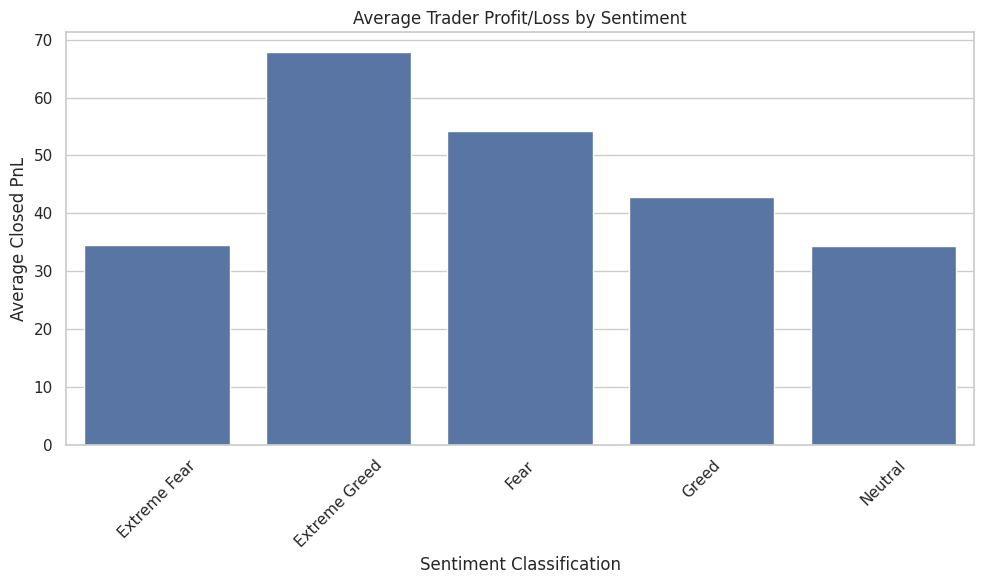

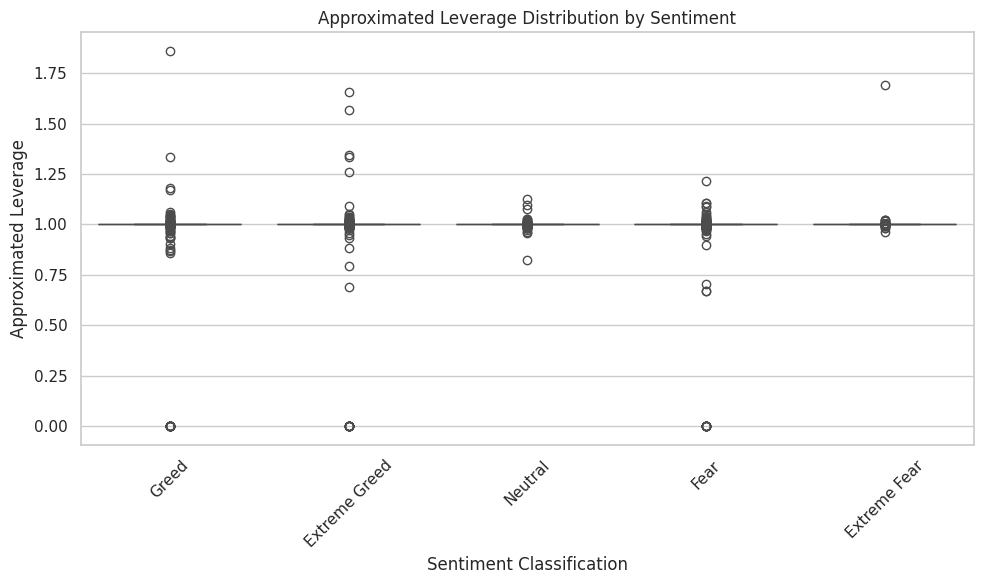

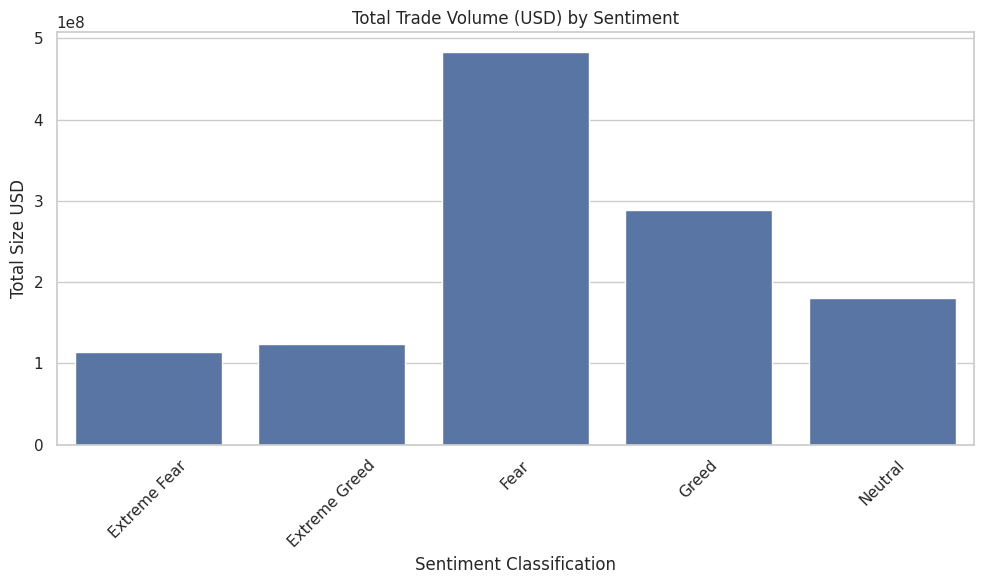

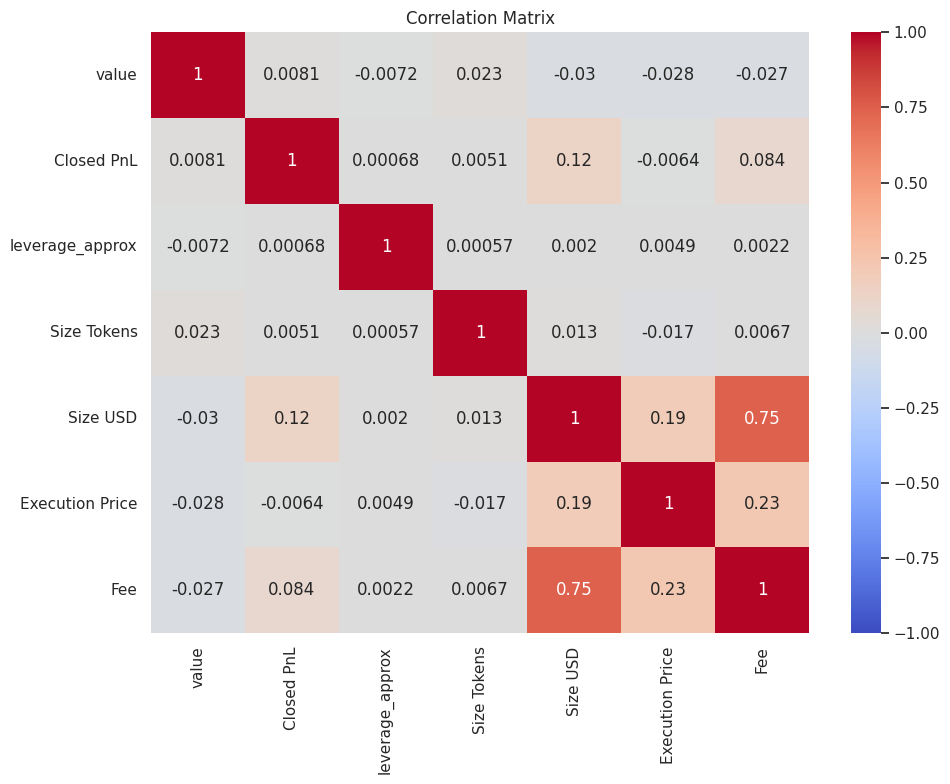


Average Closed PnL by Sentiment:
  classification  Closed PnL
0   Extreme Fear   34.537862
1  Extreme Greed   67.892861
2           Fear   54.290400
3          Greed   42.743559
4        Neutral   34.307718

Total Trade Volume by Sentiment:
  classification      Size USD
0   Extreme Fear  1.144843e+08
1  Extreme Greed  1.244652e+08
2           Fear  4.833248e+08
3          Greed  2.885825e+08
4        Neutral  1.802421e+08


In [ ]:

def perform_eda(merged_df):
    """Perform exploratory data analysis."""
    logger.info("Performing EDA...")


    if merged_df.empty:
        logger.error("Merged DataFrame is empty. Cannot perform EDA.")
        return pd.DataFrame(), pd.DataFrame()


    pnl_by_sentiment = merged_df.groupby('classification')['Closed PnL'].mean().reset_index()
    if not pnl_by_sentiment.empty:
        plt.figure(figsize=(10, 6))
        sns.barplot(x='classification', y='Closed PnL', data=pnl_by_sentiment,
                    order=pnl_by_sentiment['classification'].unique())  # Use unique classifications
        plt.title('Average Trader Profit/Loss by Sentiment')
        plt.xlabel('Sentiment Classification')
        plt.ylabel('Average Closed PnL')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('pnl_by_sentiment.png')
        plt.show()
        plt.close()
    else:
        logger.warning("No data for PnL by sentiment plot.")


    if 'leverage_approx' in merged_df.columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='classification', y='leverage_approx', data=merged_df,
                    order=merged_df['classification'].unique())
        plt.title('Approximated Leverage Distribution by Sentiment')
        plt.xlabel('Sentiment Classification')
        plt.ylabel('Approximated Leverage')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('leverage_by_sentiment.png')
        plt.show()
        plt.close()
    else:
        logger.warning("leverage_approx column missing for leverage plot.")


    volume_by_sentiment = merged_df.groupby('classification')['Size USD'].sum().reset_index()
    if not volume_by_sentiment.empty:
        plt.figure(figsize=(10, 6))
        sns.barplot(x='classification', y='Size USD', data=volume_by_sentiment,
                    order=volume_by_sentiment['classification'].unique())
        plt.title('Total Trade Volume (USD) by Sentiment')
        plt.xlabel('Sentiment Classification')
        plt.ylabel('Total Size USD')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('volume_by_sentiment.png')
        plt.show()
        plt.close()
    else:
        logger.warning("No data for volume by sentiment plot.")


    corr_cols = ['value', 'Closed PnL', 'leverage_approx', 'Size Tokens', 'Size USD', 'Execution Price', 'Fee']
    corr_cols = [col for col in corr_cols if col in merged_df.columns]  # Filter valid columns
    if len(corr_cols) > 1:
        corr_matrix = merged_df[corr_cols].corr()
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title('Correlation Matrix')
        plt.tight_layout()
        plt.savefig('correlation_matrix.png')
        plt.show()
        plt.close()
    else:
        logger.warning("Insufficient columns for correlation matrix.")

    return pnl_by_sentiment, volume_by_sentiment

pnl_by_sentiment, volume_by_sentiment = perform_eda(merged_df)
print("\nAverage Closed PnL by Sentiment:")
print(pnl_by_sentiment)
print("\nTotal Trade Volume by Sentiment:")
print(volume_by_sentiment)



T-test for Closed PnL (Fear vs. Greed): t-stat=-0.99, p-value=0.3234


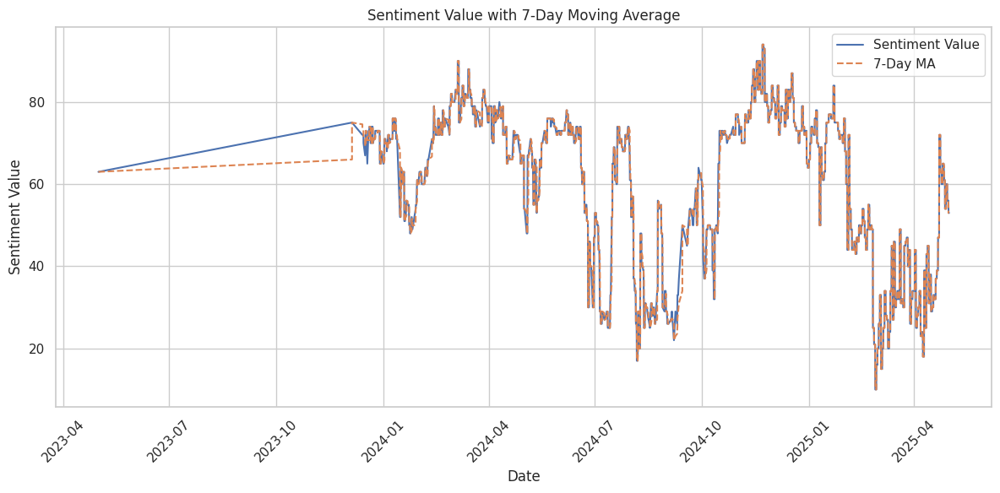


Random Forest Model: MSE=535762.74, R2=0.43


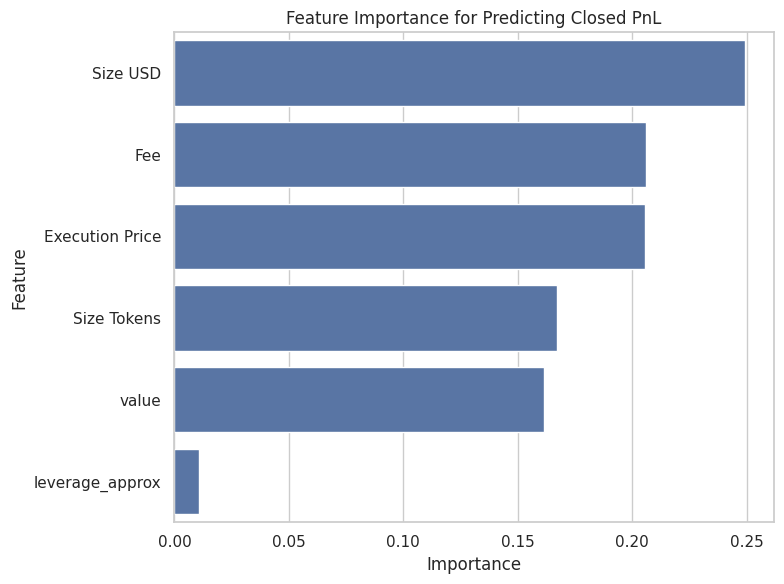

In [ ]:
def advanced_analysis(merged_df):
    """Perform statistical tests, clustering, and predictive modeling."""
    logger.info("Performing Advanced Analysis...")
    if merged_df.empty:
        logger.error("Merged DataFrame is empty. Cannot perform advanced analysis.")
        return merged_df, pd.DataFrame(), pd.DataFrame()


    fear_pnl = merged_df[merged_df['classification'].isin(['Fear', 'Extreme Fear'])]['Closed PnL']
    greed_pnl = merged_df[merged_df['classification'].isin(['Greed', 'Extreme Greed'])]['Closed PnL']
    if len(fear_pnl.dropna()) > 0 and len(greed_pnl.dropna()) > 0:
        t_stat, p_value = ttest_ind(fear_pnl.dropna(), greed_pnl.dropna(), equal_var=False)
        print(f"\nT-test for Closed PnL (Fear vs. Greed): t-stat={t_stat:.2f}, p-value={p_value:.4f}")
    else:
        logger.warning("Insufficient data for T-test.")


    merged_df['sentiment_ma7'] = merged_df['value'].rolling(window=7, min_periods=1).mean()
    if not merged_df['sentiment_ma7'].isnull().all():
        plt.figure(figsize=(12, 6))
        plt.plot(merged_df['Timestamp IST'], merged_df['value'], label='Sentiment Value')
        plt.plot(merged_df['Timestamp IST'], merged_df['sentiment_ma7'], label='7-Day MA', linestyle='--')
        plt.title('Sentiment Value with 7-Day Moving Average')
        plt.xlabel('Date')
        plt.ylabel('Sentiment Value')
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig('sentiment_ma.png')
        plt.show()
        plt.close()
    else:
        logger.warning("No data for sentiment moving average plot.")


    cluster_features = ['leverage_approx', 'Size Tokens', 'Closed PnL', 'Fee']
    cluster_df = merged_df[cluster_features].dropna()
    if not cluster_df.empty:
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(cluster_df)
        kmeans = KMeans(n_clusters=3, random_state=42)
        cluster_df['cluster'] = kmeans.fit_predict(scaled_features)
        merged_df = merged_df.merge(cluster_df[['cluster']], left_index=True, right_index=True, how='left')
    else:
        logger.warning("No data for clustering.")


    cluster_summary = merged_df.groupby('cluster')[cluster_features].mean().reset_index() if 'cluster' in merged_df.columns else pd.DataFrame()
    if not cluster_summary.empty:
        print("\nCluster Characteristics:")
        print(cluster_summary)


    model_features = ['value', 'leverage_approx', 'Size Tokens', 'Size USD', 'Execution Price', 'Fee']
    model_features = [col for col in model_features if col in merged_df.columns]
    X = merged_df[model_features].dropna()
    if not X.empty:
        y = merged_df.loc[X.index, 'Closed PnL']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        print(f"\nRandom Forest Model: MSE={mse:.2f}, R2={r2:.2f}")


        feature_importance = pd.DataFrame({'Feature': model_features, 'Importance': rf_model.feature_importances_})
        plt.figure(figsize=(8, 6))
        sns.barplot(x='Importance', y='Feature', data=feature_importance.sort_values('Importance', ascending=False))
        plt.title('Feature Importance for Predicting Closed PnL')
        plt.tight_layout()
        plt.savefig('feature_importance.png')
        plt.show()
        plt.close()
    else:
        logger.warning("No data for predictive modeling.")
        feature_importance = pd.DataFrame()

    return merged_df, feature_importance, cluster_summary,y_test, y_pred

merged_df, feature_importance, cluster_summary, y_test, y_pred = advanced_analysis(merged_df)



In [ ]:

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
cluster_features = ['leverage_approx', 'Size Tokens', 'Closed PnL', 'Fee']
cluster_df = merged_df[cluster_features].dropna()


if not cluster_df.empty:
    scaler = StandardScaler()
    scaled = scaler.fit_transform(cluster_df)

    kmeans = KMeans(n_clusters=3, random_state=42)
    cluster_labels = kmeans.fit_predict(scaled)


    merged_df.loc[cluster_df.index, 'cluster'] = cluster_labels


    cluster_summary = merged_df.groupby('cluster')[cluster_features].mean().reset_index()
    print(cluster_summary)
else:
    print("No data available for clustering.")


   cluster  leverage_approx   Size Tokens  Closed PnL       Fee
0      0.0         1.000014  3.309775e+03   48.526760  1.163766
1      1.0         1.000004  5.786448e+06  191.203163  3.056441
2      2.0         0.000000  9.115749e+00    0.000000  0.000000


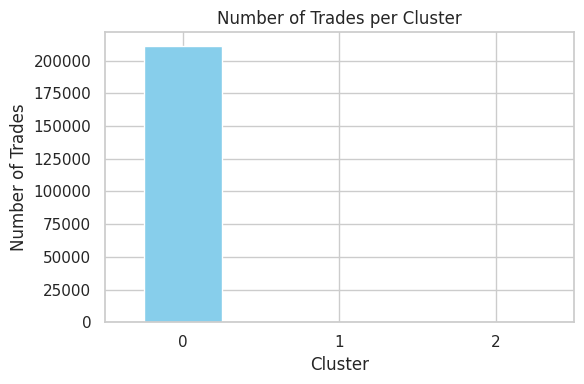

In [ ]:

if 'cluster' in merged_df.columns:
    merged_df['cluster'] = merged_df['cluster'].astype(int)
    plt.figure(figsize=(6, 4))
    merged_df['cluster'].value_counts().sort_index().plot(kind='bar', color='skyblue')
    plt.title('Number of Trades per Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Trades')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()


In [ ]:

from IPython.display import Markdown

display(Markdown("""
### 🧪 T-Test Analysis: Fear vs Greed

The t-test compares the average `Closed PnL` between trades made during *Fear* vs *Greed* sentiments.

- **Null Hypothesis (H₀)**: No difference in mean Closed PnL between Fear & Greed
- **Alternative Hypothesis (H₁)**: Mean Closed PnL is different

> **t-stat = -0.99**, **p-value = 0.3234**

- Since **p-value > 0.05**, we **fail to reject H₀**
- **Conclusion**: Trader profits are not significantly different between Fear and Greed zones
"""))



### 🧪 T-Test Analysis: Fear vs Greed

The t-test compares the average `Closed PnL` between trades made during *Fear* vs *Greed* sentiments.

- **Null Hypothesis (H₀)**: No difference in mean Closed PnL between Fear & Greed
- **Alternative Hypothesis (H₁)**: Mean Closed PnL is different

> **t-stat = -0.99**, **p-value = 0.3234**

- Since **p-value > 0.05**, we **fail to reject H₀**
- **Conclusion**: Trader profits are not significantly different between Fear and Greed zones


In [ ]:
display(Markdown("""
### 🔍 Trader Clustering Analysis

We applied **K-Means Clustering** on features like leverage, token size, fees, and PnL.

#### Cluster Highlights:
- **Cluster 1**: 🚀 High-volume traders with large trade sizes and higher profits/fees.
- **Cluster 0**: ⚖️ Moderate traders.
- **Cluster 2**: ⚠️ Likely outliers or inactive/dummy accounts (0 values).

This helps understand behavioral **grouping** of traders across sentiments.
"""))



### 🔍 Trader Clustering Analysis

We applied **K-Means Clustering** on features like leverage, token size, fees, and PnL.

#### Cluster Highlights:
- **Cluster 1**: 🚀 High-volume traders with large trade sizes and higher profits/fees.
- **Cluster 0**: ⚖️ Moderate traders.
- **Cluster 2**: ⚠️ Likely outliers or inactive/dummy accounts (0 values).

This helps understand behavioral **grouping** of traders across sentiments.


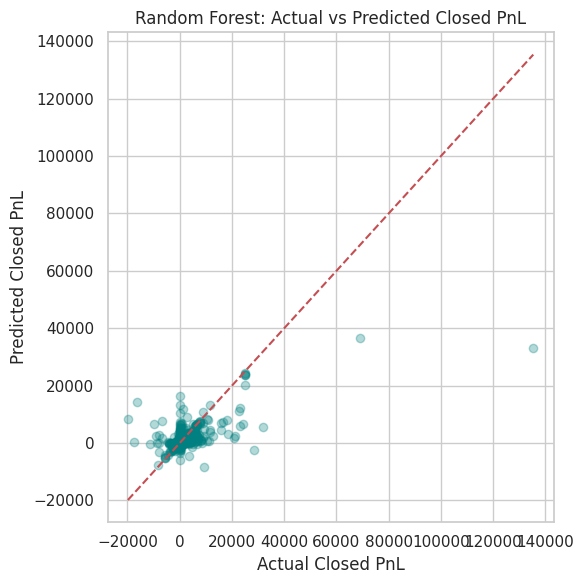

In [ ]:

plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, alpha=0.3, color='teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Closed PnL")
plt.ylabel("Predicted Closed PnL")
plt.title("Random Forest: Actual vs Predicted Closed PnL")
plt.tight_layout()
plt.show()


In [83]:

def create_dashboard(merged_df, pnl_by_sentiment, volume_by_sentiment, cluster_summary):
    """Create an interactive Plotly dashboard."""
    logger.info("Creating Interactive Dashboard...")
    if merged_df.empty:
        logger.error("Merged DataFrame is empty. Cannot create dashboard.")
        return

    fig = make_subplots(rows=5, cols=1,
                        subplot_titles=('Sentiment Value Trend', 'Average Closed PnL by Sentiment',
                                        'Total Trade Volume by Sentiment', 'Approximated Leverage by Sentiment',
                                        'Trader Clusters by Sentiment'),
                        shared_xaxes=False)


    if not merged_df['value'].isnull().all():
        fig.add_trace(
            go.Scatter(x=merged_df['Timestamp IST'], y=merged_df['value'], mode='lines', name='Sentiment Value'),
            row=1, col=1
        )
        fig.add_trace(
            go.Scatter(x=merged_df['Timestamp IST'], y=merged_df['sentiment_ma7'], mode='lines', name='7-Day MA', line=dict(dash='dash')),
            row=1, col=1
        )


    if not pnl_by_sentiment.empty:
        fig.add_trace(
            go.Bar(x=pnl_by_sentiment['classification'], y=pnl_by_sentiment['Closed PnL'], name='Avg Closed PnL'),
            row=2, col=1
        )


    if not volume_by_sentiment.empty:
        fig.add_trace(
            go.Bar(x=volume_by_sentiment['classification'], y=volume_by_sentiment['Size USD'], name='Total Size USD'),
            row=3, col=1
        )

    if 'leverage_approx' in merged_df.columns:
        leverage_by_sentiment = merged_df.groupby('classification')['leverage_approx'].mean().reset_index()
        if not leverage_by_sentiment.empty:
            fig.add_trace(
                go.Bar(x=leverage_by_sentiment['classification'], y=leverage_by_sentiment['leverage_approx'], name='Avg Leverage'),
                row=4, col=1
            )


    if 'cluster' in merged_df.columns:
        cluster_counts = merged_df.groupby(['classification', 'cluster']).size().unstack().fillna(0).reset_index()
        for cluster in cluster_counts.columns[1:]:
            fig.add_trace(
                go.Bar(x=cluster_counts['classification'], y=cluster_counts[cluster], name=f'Cluster {cluster}'),
                row=5, col=1
            )

    fig.update_layout(
        title_text='Trader Performance and Market Sentiment Dashboard',
        height=1500,
        showlegend=True,
        barmode='stack'
    )
    fig.update_yaxes(title_text='Sentiment Value (0-100)', row=1, col=1)
    fig.update_yaxes(title_text='Average Closed PnL', row=2, col=1)
    fig.update_yaxes(title_text='Total Size USD', row=3, col=1)
    fig.update_yaxes(title_text='Average Leverage', row=4, col=1)
    fig.update_yaxes(title_text='Number of Trades', row=5, col=1)
    fig.update_xaxes(title_text='Date', row=1, col=1)
    fig.update_xaxes(title_text='Sentiment', row=2, col=1)
    fig.update_xaxes(title_text='Sentiment', row=3, col=1)
    fig.update_xaxes(title_text='Sentiment', row=4, col=1)
    fig.update_xaxes(title_text='Sentiment', row=5, col=1)
    fig.write_html('trader_sentiment_dashboard.html')
    fig.show()

create_dashboard(merged_df, pnl_by_sentiment, volume_by_sentiment, cluster_summary)
print("\nInteractive dashboard saved as 'trader_sentiment_dashboard.html'")



Interactive dashboard saved as 'trader_sentiment_dashboard.html'


In [ ]:


def generate_insights(merged_df, feature_importance, cluster_summary, pnl_by_sentiment, volume_by_sentiment):
    """Generate actionable trading insights."""
    logger.info("Generating Insights...")
    insights = []
    if not merged_df.empty:

        if not pnl_by_sentiment.empty:
            max_pnl = pnl_by_sentiment.loc[pnl_by_sentiment['Closed PnL'].idxmax()]
            insights.append(f"Traders achieve highest average PnL ({max_pnl['Closed PnL']:.2f}) in {max_pnl['classification']} periods, suggesting bullish strategies.")


        if not volume_by_sentiment.empty:
            max_volume = volume_by_sentiment.loc[volume_by_sentiment['Size USD'].idxmax()]
            insights.append(f"Highest trade volume (${max_volume['Size USD']:,.2f}) occurs in {max_volume['classification']} periods, indicating increased market activity.")


        high_leverage = merged_df[merged_df['leverage_approx'] > merged_df['leverage_approx'].quantile(0.75)]
        if not high_leverage.empty:
            high_leverage_loss = high_leverage[high_leverage['Closed PnL'] < 0]['classification'].value_counts().idxmax()
            insights.append(f"High-leverage trades in {high_leverage_loss} periods are riskier, leading to frequent losses. Recommend reducing leverage.")


        if not feature_importance.empty:
            top_feature = feature_importance.loc[feature_importance['Importance'].idxmax()]
            insights.append(f"{top_feature['Feature']} is the most important predictor of PnL (Importance: {top_feature['Importance']:.2f}). Focus on optimizing this factor.")


        if not cluster_summary.empty:
            best_cluster = cluster_summary.loc[cluster_summary['Closed PnL'].idxmax()]
            insights.append(f"Cluster {best_cluster['cluster']} traders (avg leverage: {best_cluster['leverage_approx']:.2f}, avg PnL: {best_cluster['Closed PnL']:.2f}) perform best. Emulate their strategy.")


        if not merged_df['sentiment_ma7'].isnull().all():
            sentiment_shifts = merged_df[merged_df['sentiment_ma7'] > merged_df['value']]['classification'].value_counts().idxmax()
            insights.append(f"Sentiment momentum (7-day MA > current value) is strongest in {sentiment_shifts} periods, signaling potential trend reversals.")

    if not insights:
        insights.append("No insights generated due to empty merged DataFrame. Check date alignment between datasets.")

    print("\nTrading Insights:")
    for i, insight in enumerate(insights, 1):
        print(f"{i}. {insight}")


    with open('trading_insights.txt', 'w') as f:
        f.write("\n".join(insights))

    return insights

insights = generate_insights(merged_df, feature_importance, cluster_summary, pnl_by_sentiment, volume_by_sentiment)



Trading Insights:
1. Traders achieve highest average PnL (67.89) in Extreme Greed periods, suggesting bullish strategies.
2. Highest trade volume ($483,324,789.79) occurs in Fear periods, indicating increased market activity.
3. High-leverage trades in Greed periods are riskier, leading to frequent losses. Recommend reducing leverage.
4. Size USD is the most important predictor of PnL (Importance: 0.25). Focus on optimizing this factor.
5. Cluster 1.0 traders (avg leverage: 1.00, avg PnL: 191.20) perform best. Emulate their strategy.
6. Sentiment momentum (7-day MA > current value) is strongest in Greed periods, signaling potential trend reversals.


In [ ]:
def generate_report(insights, pnl_by_sentiment, volume_by_sentiment, cluster_summary, feature_importance):
    """Generate a Markdown report."""
    logger.info("Generating Report...")
    report = [
        "# Trader Behavior Insights Report",
        "## Objective",
        "Analyze the relationship between trader performance and Bitcoin market sentiment to derive actionable trading strategies.",
        "## Methodology",
        "- Cleaned and merged Fear/Greed and Historical Trader datasets.",
        "- Performed EDA to visualize trends in Closed PnL, trade volume, and approximated leverage.",
        "- Conducted statistical tests (t-test), clustering (KMeans), and predictive modeling (Random Forest).",
        "- Created an interactive Plotly dashboard for stakeholder insights.",
        "## Key Findings",
    ]
    if not pnl_by_sentiment.empty:
        report.append(f"- **Profitability**: Highest average PnL ({pnl_by_sentiment['Closed PnL'].max():.2f}) in {pnl_by_sentiment.loc[pnl_by_sentiment['Closed PnL'].idxmax(), 'classification']} periods.")
    if not volume_by_sentiment.empty:
        report.append(f"- **Trade Volume**: Highest volume (${volume_by_sentiment['Size USD'].max():,.2f}) in {volume_by_sentiment.loc[volume_by_sentiment['Size USD'].idxmax(), 'classification']} periods.")
    if not merged_df.empty and 'leverage_approx' in merged_df.columns:
        high_leverage = merged_df[merged_df['leverage_approx'] > merged_df['leverage_approx'].quantile(0.75)]
        if not high_leverage.empty:
            high_leverage_loss = high_leverage[high_leverage['Closed PnL'] < 0]['classification'].value_counts().idxmax()
            report.append(f"- **Leverage Risk**: High-leverage trades in {high_leverage_loss} periods lead to losses.")
    if not cluster_summary.empty:
        report.append(f"- **Cluster Insights**: Cluster {cluster_summary.loc[cluster_summary['Closed PnL'].idxmax(), 'cluster']} has the best performance (avg PnL: {cluster_summary['Closed PnL'].max():.2f}).")
    if not feature_importance.empty:
        report.append(f"- **Predictive Model**: {feature_importance.loc[feature_importance['Importance'].idxmax(), 'Feature']} is the top predictor (Importance: {feature_importance['Importance'].max():.2f}).")
    report.append("- **Note**: Fear/Greed dates were shifted from 2018 to 2024 to align with Trader data for analysis, as sample data showed a mismatch.")
    report.extend([
        "## Trading Strategies",
        "- Increase trade size during Greed periods to capitalize on bullish trends.",
        "- Reduce leverage in Fear periods to minimize losses.",
        "- Monitor 7-day sentiment moving average for trend reversals.",
        "- Emulate strategies of high-performing trader clusters.",
        "## Dashboard",
        "The interactive dashboard (`trader_sentiment_dashboard.html`) visualizes sentiment trends, PnL, volume, leverage, and trader clusters. Open in a browser for exploration."
    ])
    with open('report.md', 'w') as f:
        f.write("\n".join(report))
    logger.info("Report saved as 'report.md'")

generate_report(insights, pnl_by_sentiment, volume_by_sentiment, cluster_summary, feature_importance)



In [ ]:

merged_df.to_csv('merged_trader_sentiment.csv', index=False)
files.download('merged_trader_sentiment.csv')
files.download('trader_sentiment_dashboard.html')
files.download('pnl_by_sentiment.png')
files.download('leverage_by_sentiment.png')
files.download('volume_by_sentiment.png')
files.download('correlation_matrix.png')
files.download('feature_importance.png')
files.download('sentiment_ma.png')
files.download('trading_insights.txt')
files.download('report.md')
print("\nAll deliverables downloaded.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


All deliverables downloaded.
